In [2]:
import os
import sys
parent_dr = os.path.split(os.getcwd())[0]
if parent_dr not in sys.path:
    sys.path.append(parent_dr)

In [36]:
%load_ext autoreload
%autoreload 2

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.sparse as sp
import scipy.linalg as sla
from sklearn.decomposition import NMF, TruncatedSVD
import numpy.linalg as la
from time import time
from core.data.arxiv_data_io import *
from core.data.text.tf_idf_helpers import *
from core.matrix.svd_decomposition_helpers import *
from core.matrix.nmf_decompositions import *

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [4]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)

In [39]:
#reading in the full arXiv subset df
file_name = "tokenized_arxiv_subset_15540.pkl"
full_path = os.path.join(parent_dr, "core", "resources", file_name)
data_df = pd.read_pickle(full_path)

In [40]:
# splitting out the test and train dfs
train_df, test_df = sample_arxiv_data_by_category(data_df)
assert len(train_df)/len(data_df) == 0.8

In [42]:
tfidf_train_matrix, index_to_doc = transform_tfidf(train_df,tfidf_obj=tfidf_obj)

In [86]:
df = pd.DataFrame.sparse.from_spmatrix(tfidf_train_matrix)

# SVD Feature Interpretation

In [83]:
df = pd.DataFrame.sparse.from_spmatrix(tfidf_train_matrix)

(12432, 30460)

In [23]:
#Reading in full SVD
U_file_name = "tfidf_train_full_svd_U.pkl"
U_file_path = os.path.join(parent_dr, "notebooks", "output", U_file_name)
U = np.load(U_file_path, allow_pickle=True)

VT_file_name = "tfidf_train_full_svd_V_T.pkl"
VT_file_path = os.path.join(parent_dr, "notebooks", "output", VT_file_name)
VT = np.load(VT_file_path, allow_pickle=True)

S_file_name = "tfidf_train_full_svd_sigmas.pkl"
S_file_path = os.path.join(parent_dr, "notebooks", "output", S_file_name)
S = np.load(S_file_path, allow_pickle=True)

print(f'U_from_pkl has dimensions: {U.shape}')
print(f'V_T_from_pkl has dimensions:{VT.shape}')
print(f'Number of singluar values:{S.shape}')

U_from_pkl has dimensions: (12432, 12431)
V_T_from_pkl has dimensions:(12431, 30460)
Number of singluar values:(12431,)


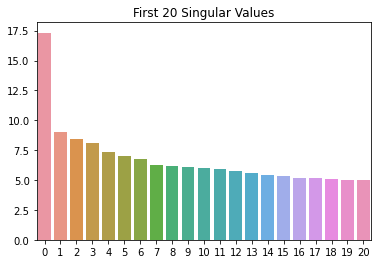

In [25]:
S_20 = S[:21]
sns.barplot(x=list(range(len(S_20))), y = S_20)
plt.title("First 20 Singular Values")
plt.show()

In [54]:
term_topic_matrix = pd.DataFrame(data=VT, 
                                 columns = [f'Latent_concept_{r}' 
                                            for r in range(0,VT.shape[1])])

term_topic_matrix.head()

,Latent_concept_0,Latent_concept_1,Latent_concept_2,Latent_concept_3,Latent_concept_4,Latent_concept_5,Latent_concept_6,Latent_concept_7,Latent_concept_8,Latent_concept_9,Latent_concept_10,Latent_concept_11,Latent_concept_12,Latent_concept_13,Latent_concept_14,Latent_concept_15,Latent_concept_16,Latent_concept_17,Latent_concept_18,Latent_concept_19,Latent_concept_20,Latent_concept_21,Latent_concept_22,Latent_concept_23,Latent_concept_24,Latent_concept_25,Latent_concept_26,Latent_concept_27,Latent_concept_28,Latent_concept_29,Latent_concept_30,Latent_concept_31,Latent_concept_32,Latent_concept_33,Latent_concept_34,Latent_concept_35,Latent_concept_36,Latent_concept_37,Latent_concept_38,Latent_concept_39,Latent_concept_40,Latent_concept_41,Latent_concept_42,Latent_concept_43,Latent_concept_44,Latent_concept_45,Latent_concept_46,Latent_concept_47,Latent_concept_48,Latent_concept_49,Latent_concept_50,Latent_concept_51,Latent_concept_52,Latent_concept_53,Latent_concept_54,Latent_concept_55,Latent_concept_56,Latent_concept_57,Latent_concept_58,Latent_concept_59,Latent_concept_60,Latent_concept_61,Latent_concept_62,Latent_concept_63,Latent_concept_64,Latent_concept_65,Latent_concept_66,Latent_concept_67,Latent_concept_68,Latent_concept_69,Latent_concept_70,Latent_concept_71,Latent_concept_72,Latent_concept_73,Latent_concept_74,Latent_concept_75,Latent_concept_76,Latent_concept_77,Latent_concept_78,Latent_concept_79,Latent_concept_80,Latent_concept_81,Latent_concept_82,Latent_concept_83,Latent_concept_84,Latent_concept_85,Latent_concept_86,Latent_concept_87,Latent_concept_88,Latent_concept_89,Latent_concept_90,Latent_concept_91,Latent_concept_92,Latent_concept_93,Latent_concept_94,Latent_concept_95,Latent_concept_96,Latent_concept_97,Latent_concept_98,Latent_concept_99,Latent_concept_100,Latent_concept_101,Latent_concept_102,Latent_concept_103,Latent_concept_104,Latent_concept_105,Latent_concept_106,Latent_concept_107,Latent_concept_108,Latent_concept_109,Latent_concept_110,Latent_concept_111,Latent_concept_112,Latent_concept_113,Latent_concept_114,Latent_concept_115,Latent_concept_116,Latent_concept_117,Latent_concept_118,Latent_concept_119,Latent_concept_120,Latent_concept_121,Latent_concept_122,Latent_concept_123,Latent_concept_124,Latent_concept_125,Latent_concept_126,Latent_concept_127,Latent_concept_128,Latent_concept_129,Latent_concept_130,Latent_concept_131,Latent_concept_132,Latent_concept_133,Latent_concept_134,Latent_concept_135,Latent_concept_136,Latent_concept_137,Latent_concept_138,Latent_concept_139,Latent_concept_140,Latent_concept_141,Latent_concept_142,Latent_concept_143,Latent_concept_144,Latent_concept_145,Latent_concept_146,Latent_concept_147,Latent_concept_148,Latent_concept_149,Latent_concept_150,Latent_concept_151,Latent_concept_152,Latent_concept_153,Latent_concept_154,Latent_concept_155,Latent_concept_156,Latent_concept_157,Latent_concept_158,Latent_concept_159,Latent_concept_160,Latent_concept_161,Latent_concept_162,Latent_concept_163,Latent_concept_164,Latent_concept_165,Latent_concept_166,Latent_concept_167,Latent_concept_168,Latent_concept_169,Latent_concept_170,Latent_concept_171,Latent_concept_172,Latent_concept_173,Latent_concept_174,Latent_concept_175,Latent_concept_176,Latent_concept_177,Latent_concept_178,Latent_concept_179,Latent_concept_180,Latent_concept_181,Latent_concept_182,Latent_concept_183,Latent_concept_184,Latent_concept_185,Latent_concept_186,Latent_concept_187,Latent_concept_188,Latent_concept_189,Latent_concept_190,Latent_concept_191,Latent_concept_192,Latent_concept_193,Latent_concept_194,Latent_concept_195,Latent_concept_196,Latent_concept_197,Latent_concept_198,Latent_concept_199,Latent_concept_200,Latent_concept_201,Latent_concept_202,Latent_concept_203,Latent_concept_204,Latent_concept_205,Latent_concept_206,Latent_concept_207,Latent_concept_208,Latent_concept_209,Latent_concept_210,Latent_concept_211,Latent_concept_212,Latent_concept_213,Latent_concept_214,Latent_concept_215,Laten

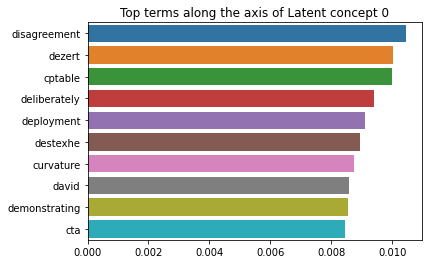

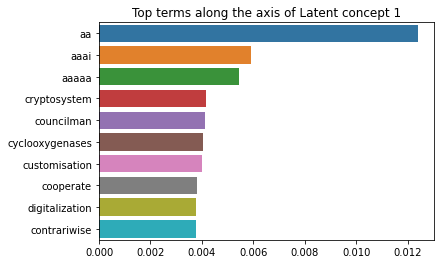

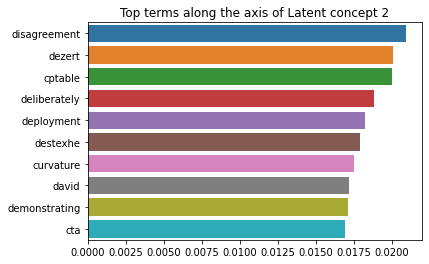

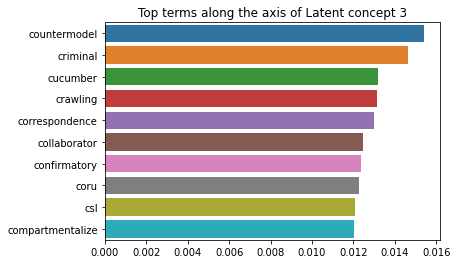

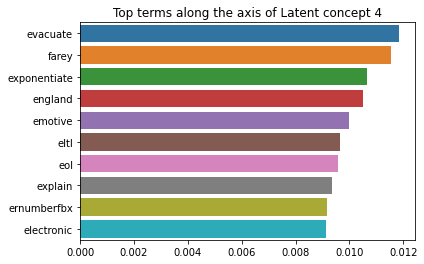

In [74]:
for i in range(5):
    data = term_topic_matrix[f'Latent_concept_{i}']
    data = data.sort_values(ascending=False)
    top_10 = data[:10]
    top_10 = top_10.rename(index=index_to_word)
    plt.title(f'Top terms along the axis of Latent concept {i}')
    fig = sns.barplot(x=top_10.values , y=top_10.index, orient = 'h')
    plt.show()
    plt.close()

# NMF Feature Interpretation

In [93]:
n_samples, n_features = tfidf_train_matrix.shape
k = 5

In [94]:
#this takes about a minute
print("Fitting the NMF model with n_samples=%d and n_features=%d, and n_components=%d..."
      % (n_samples, n_features, k))

nmf_model = NMF(n_components = k, 
                init='nndsvd', 
                max_iter=1000,
                random_state=1)
W = nmf_model.fit_transform(tfidf_train_matrix)

H = nmf_model.components_

Fitting the NMF model with n_samples=12432 and n_features=30460, and n_components=5...


In [95]:
topic_list = []
for topic_idx, topic in enumerate(nmf_model.components_):
    top_n = [index_to_word[i]
             for i in topic.argsort()
             [-n_words:]][::-1]
    top_features = ' '.join(top_n)
    topic_list.append(f"topic_{'_'.join(top_n[:3])}") 

    print(f"Topic {topic_idx}: {top_features}")

Topic 0: problem algorithm set model decision constraint belief probability method approach
Topic 1: number graph vertex edge algorithm time problem free color tree
Topic 2: datum system technology student ai research user information number study
Topic 3: network brain model neuron neural spike activity dynamic stimulus connectivity
Topic 4: agent game learn learning environment reinforcement action task policy human
